#LAB 5: Style transfer

<h4><div style="text-align: right"> Due date: 15:00 Nov 25, 2025.  </div> <br>
<div style="text-align: right"> Please upload your file and final-report at PLATO before the class in the form of [ID_Name_Lab5.ipynb]. </div></h4>



# Neural Stylization with Pytorch
## Introduction


<img src="http://drive.google.com/uc?export=view&id=1crqAv5aoJ3uMSDFT99l6VuzY3VUlF_C7" alt="no_image" style="width: 900px;"/>


This lab introduces a Neural Algorithm of Artistic Style that can separate and recombine the image content and style of natural images. The algorithm takes two images, a content-image, and a style-image, and generates the optimized image to resemble the content of the content-image and the artistic style of the style-image.


**Main idea**

To transfer the style image $\textit{I}_s$ onto a content image $\textit{I}_c$ we synthesize a new image that simultaneously matches the content representation of $\textit{I}_c$ and the style representation of $\textit{I}_s$ (Fig). Thus we jointly minimize the distance of the feature representations of a white noise image from the content representation of the photograph in one layer and the style representation of the painting defined on a number of layers of the Convolutional Neural Network.
<img src="http://drive.google.com/uc?export=view&id=1BhfqqQEMn3AyHpc6fB-shQDlU-tQeoLz" alt="no_image" style="width: 900px;"/>

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

from PIL import Image
import numpy as np

from torchvision import datasets
from torch.utils.data import DataLoader


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/lab5.zip

Archive:  /content/drive/MyDrive/lab5.zip
   creating: lab5/content/
  inflating: lab5/content/amber.jpg  
  inflating: lab5/content/Tuebingen_Neckarfront.jpg  
   creating: lab5/style/
  inflating: lab5/style/candy.jpg    
  inflating: lab5/style/mosaic.jpg   
  inflating: lab5/style/picasso.jpg  
  inflating: lab5/style/rain-princess.jpg  
  inflating: lab5/style/rain-princess-cropped.jpg  
  inflating: lab5/style/starry-night-cropped.jpg  
  inflating: lab5/style/udnie.jpg    
  inflating: lab5/style/waterfall.jpg  
   creating: lab5/train/
   creating: lab5/train/perceptual_train/
  inflating: lab5/train/perceptual_train/2012_000003.jpg  
  inflating: lab5/train/perceptual_train/2012_000004.jpg  
  inflating: lab5/train/perceptual_train/2012_000007.jpg  
  inflating: lab5/train/perceptual_train/2012_000010.jpg  
  inflating: lab5/train/perceptual_train/2012_000014.jpg  
  inflating: lab5/train/perceptual_train/2012_000015.jpg  
  inflating: lab5/train/perceptual_train/2012_000016.j

**Style and content image**

In [ ]:
style_img_name = "lab5/style/mosaic.jpg"
content_img_name = "lab5/content/Tuebingen_Neckarfront.jpg"

In [ ]:
style_img = Image.open(style_img_name)
content_img = Image.open(content_img_name)

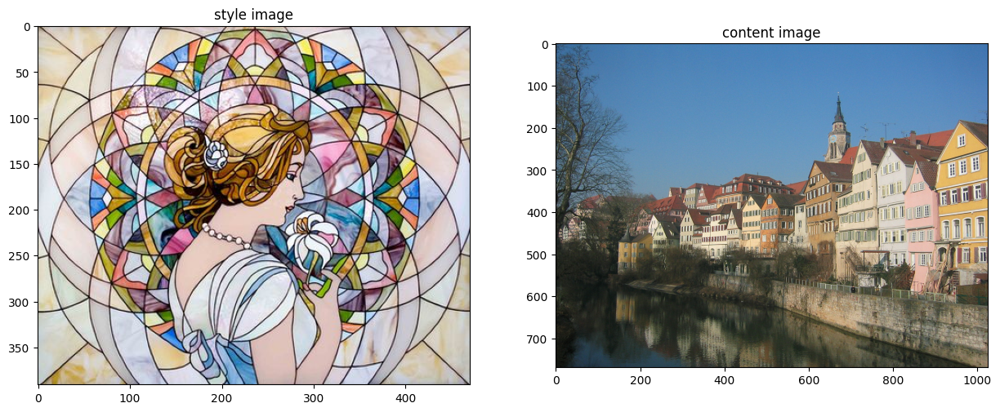

In [ ]:
plt.figure(figsize = (15,15))
plt.subplot(1,2,1)
plt.title('style image')
plt.imshow(style_img)
plt.subplot(1,2,2)
plt.title('content image')
plt.imshow(content_img)

### Style representation

To obtain a representation of the style of an input image, we use a feature space designed to capture texture information. This feature space can be built on top of the filter responses in any layer of the network. It consists of the correlations between the different filter responses, where the expectation is taken over the spatial extent of the feature maps. These feature correlations are given by the Gram matrix $\mathit{G} \in \mathcal{R}^{\mathit{N_l}  \times  \mathit{N_l}}$, where $\mathit{G^l_{ij}}$ is the inner product between the vectorised feature maps $i$ and $j$ in layer $l$:

### <center> ${\mathit{G^l_{ij}} = \sum_{k}{F^l_{ik}F^l_{jk}}}$ </center>

In [ ]:
def gram_matrix(y):
    (b, ch, h, w) = y.size()
    features = y.view(b, ch, w * h)
    features_t = features.transpose(1, 2)
    gram = features.bmm(features_t) / (ch * h * w)
    return gram

### Deep image representations

In this work we show how the generic feature representations learned by high-performing Convolutional Neural Networks can be used to independently process and manipulate the content and the style of natural images.

The image reperesentations were generated on the basis of the VGG network, which was trained to perform object recognition and localization. We use the feature space provided by the 16 convolutional and 5 pooling layers of the 19-layer VGG network.

In [ ]:
import torchvision.models.vgg as vgg

class LossNetwork(torch.nn.Module):
    def __init__(self):
        super(LossNetwork, self).__init__()
        # get vgg network
        self.vgg_layers = vgg.vgg19(pretrained=True).features


    def forward(self, x, layer_name):
        output = {}
        for name, module in self.vgg_layers._modules.items():
            x = module(x)
            if name in layer_name:
                output[layer_name[name]] = x
        return output

In [ ]:
loss_net = LossNetwork().cuda()
for param in loss_net.parameters():
    param.requires_grad = False

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:04<00:00, 134MB/s]


Content representation is on layer ‘conv4 2’ and the style representation is on layers ‘conv1 1’, ‘conv2 1’, ‘conv3 1’, ‘conv4 1’ and ‘conv5 1’

In [ ]:
style_layer_name = {
    '1': "conv1-1",
    '6': "conv2-1",
    '11': "conv3-1",
    '20': "conv4-1",
    '29': "conv5-1"
}

content_layer_name = {
    '22': "conv4-2"
}

**Pre and post processing for images**

In [ ]:

img_size = 512
prep = transforms.Compose([transforms.Resize(img_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.40760392, 0.45795686, 0.48501961], #subtract imagenet mean
                        std=[1,1,1]),
])

post = transforms.Compose([
    transforms.Normalize(mean=[-0.40760392, -0.45795686, -0.48501961], #add imagenet mean
                        std=[1,1,1]),
    transforms.Lambda(lambda x: torch.clamp(x,0,1)),
    transforms.ToPILImage()
])

In [ ]:
content = prep(content_img).cuda().unsqueeze(0)
style = prep(style_img).cuda().unsqueeze(0)

out_img = content.clone()
out_img.requires_grad = True


criterion = nn.MSELoss()
style_gt = [gram_matrix(f).detach() for f in loss_net(style, style_layer_name).values()]
content_gt = [A.detach() for A in loss_net(content, content_layer_name).values()]

show_iter = 50
optimizer = optim.LBFGS([out_img])
n_iter = [0]

**Hyper parameters**

In [ ]:
alpha = 1e0
beta = 1e7
max_iter = 500

**Optimizing image**

In [ ]:
while n_iter[0] <= max_iter:

    def closure():
        optimizer.zero_grad()

        style_layers = [gram_matrix(f) for f in loss_net(out_img, style_layer_name).values()]
        content_layers = [f for f in loss_net(out_img, content_layer_name).values()]

        style_loss = 0
        for i in range(len(style_layers)):
            style_loss += criterion(style_layers[i], style_gt[i])

        content_loss = criterion(content_layers[0], content_gt[0])

        loss = alpha * content_loss + beta * style_loss
        loss.backward()
        n_iter[0]+=1
        #print loss
        if n_iter[0]%show_iter == (show_iter-1):
            print('Iteration: %d, loss: %f'%(n_iter[0]+1, loss.item()))

        return loss

    optimizer.step(closure)

#display result

/usr/local/lib/python3.12/dist-packages/torch/optim/lbfgs.py:457: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:835.)
  loss = float(closure())


Iteration: 50, loss: 9.142822
Iteration: 100, loss: 6.458977
Iteration: 150, loss: 5.712865
Iteration: 200, loss: 5.362953
Iteration: 250, loss: 5.164565
Iteration: 300, loss: 5.036399
Iteration: 350, loss: 4.945664
Iteration: 400, loss: 4.876983
Iteration: 450, loss: 4.825977
Iteration: 500, loss: 4.785293


**Visualize result images**

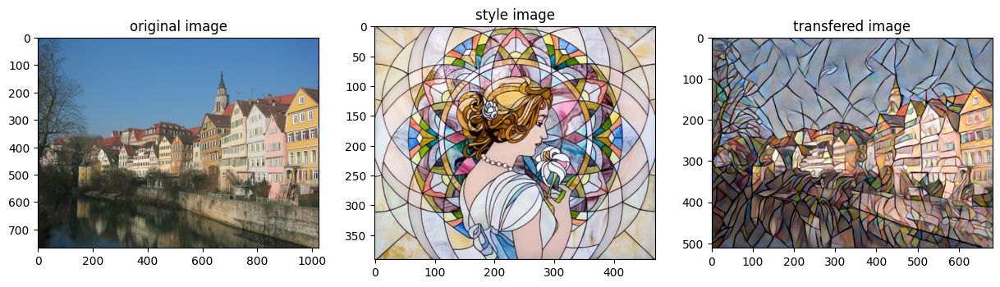

In [ ]:
out_img_hr = post(out_img.data[0].cpu().squeeze())

plt.figure(figsize = (15,15))

plt.subplot(1,3,1)
plt.title('original image')
plt.imshow(content_img)
plt.subplot(1,3,2)
plt.title('style image')
plt.imshow(style_img)
plt.subplot(1,3,3)
plt.title('transfered image')
plt.imshow(out_img_hr)
plt.show()



# Perceptual Losses for Style Transfer with Pytorch


**Main idea**

Previous method produces high-quality results, but is computationally expensive since each step of the optimization problem requires a forward and backward pass through the pretrained network. To overcome this computational burden, we train a feed-forward network to quickly approximate solutions to their optimization problem.
<img src="http://drive.google.com/uc?export=view&id=1GFM9l-63SsOFYHP-g2WNN2T6zNDdD09Z" alt="no_image" style="width: 900px;"/>


$\mathcal{L}_{total} = \alpha\sum_{}{\mathcal{l}_{content}} + \beta\sum_{}{\mathcal{l}_{style}} + \gamma\mathcal{l}_{TV}$

- $\mathcal{l}_{content}^{\phi,j} = ||\phi_j(\hat{y}) - \phi_j(y)||^2_2$, $\phi$ represents vgg feature

- $\mathcal{l}_{style}^{\phi,j} = ||G^{\phi}_{j}(\hat{y}) - G^{\phi}_{j}(y)||^2_F$, $G$ represents gram matrix.

- $\mathcal{l}_{TV}(y) = \sum_{i,j}{|y_{i+1,j}-y_{i,j}|+|y_{i,j+1}-y_{i,j}|}$



**Data loader**

In [ ]:
data_root = "lab5/train"
image_size = 224
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])])

train_dataset = datasets.ImageFolder(data_root, transform)

batch_size = 4
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

### 1.1 Write code (Image Transform Net)

<img src="http://drive.google.com/uc?export=view&id=1OQzOwfRgpncvvBCwUCJbShYQGBElUqjW" alt="no_image" style="width: 400px;"/>

##### Residual block (channel, x)
- Conv 1: $3\times3$ Conv(in: channel, out: channel, padding: 1) with reflection padding
- Instance Norm
- Relu
- Conv 2: $3\times3$ Conv(in: channel, out: channel, padding: 1) with reflection padding
- Instance Norm
- Residual Connection

#### ImageTransformNet
- Conv $9\times9$  (in: 3, out: 32, padding: 4) with reflection padding
- Instance Norm
- Relu
- Conv $3\times3$  (in: 32, out: 64, padding: 1, **stride: 2**) with reflection padding
- Instance Norm
- Relu
- Conv $3\times3$  (in: 64, out:128, padding: 1, **stride: 2**) with reflection padding
- Instance Norm
- Relu
- 5 Residual block(channel: 128)
- $2\times$ Nearest Upsample
- Conv $3\times3$  (in: 128, out:64, padding: 1) with reflection padding
- Instance Norm
- Relu
- **$2\times$ Nearest Upsample**
- Conv $3\times3$  (in: 64, out:32, padding: 1) with reflection padding
- Instance Norm
- Relu
- Conv $9\times9$  (in: 32, out:3, padding: 4) with reflection padding



In [ ]:
class ImageTransformNet(torch.nn.Module):
    # f(w) 구현
    def __init__(self):
        super(ImageTransformNet, self).__init__()
        #############
        # CODE HERE #
        #############

        # 첫 번째 Conv
        self.conv1 = ConvLayer(in_channels=3, out_channels=32, kernel_size=9, stride=1)
        self.in1 = nn.InstanceNorm2d(num_features=32,affine=True)
        self.relu1 = nn.ReLU()

        # 두 번째 Conv
        self.conv2 = ConvLayer(in_channels=32, out_channels=64, kernel_size=3, stride=2)
        self.in2 = nn.InstanceNorm2d(num_features=64,affine=True)
        self.relu2 = nn.ReLU()

        # 세 번째 Conv
        self.conv3 = ConvLayer(in_channels=64, out_channels=128, kernel_size=3, stride=2)
        self.in3 = nn.InstanceNorm2d(num_features=128,affine=True)
        self.relu3 = nn.ReLU()

        # 5개 Residual Block
        self.residual_blocks = nn.Sequential(*[ResidualBlock(128) for _ in range(5)])

        # 첫 번째 Upsample
        self.upsample1 = UpsampleConvLayer(in_channels=128, out_channels=64, kernel_size=3, stride=1, upsample=2)
        self.in4 = nn.InstanceNorm2d(num_features=64,affine=True)
        self.relu4 = nn.ReLU()

        # 두 번째 Upsample
        self.upsample2 = UpsampleConvLayer(in_channels=64, out_channels=32, kernel_size=3, stride=1,upsample=2)
        self.in5 = nn.InstanceNorm2d(num_features=32,affine=True)
        self.relu5 = nn.ReLU()

        # 마지막 Conv
        self.conv4 = ConvLayer(in_channels=32, out_channels=3, kernel_size=9, stride=1)

    def forward(self, X):
        #############
        # CODE HERE #
        #############

        # 첫 번째 conv
        out = self.relu1(self.in1(self.conv1(X)))

        # 두 번째 conv
        out = self.relu2(self.in2(self.conv2(out)))

        # 세 번째 conv
        out = self.relu3(self.in3(self.conv3(out)))

        # Residual Block
        out = self.residual_blocks(out)

        # 첫 번째 Upsample
        out = self.relu4(self.in4(self.upsample1(out)))

        # 두 번째 Upsample
        out = self.relu5(self.in5(self.upsample2(out)))

        # 마지막 Conv
        out = self.conv4(out)

        return torch.sigmoid(out)

class ConvLayer(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride):
        super(ConvLayer, self).__init__()
        reflection_padding = kernel_size // 2
        self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
        self.conv2d = torch.nn.Conv2d(
            in_channels, out_channels, kernel_size, stride)

    def forward(self, x):
        out = self.reflection_pad(x)
        out = self.conv2d(out)
        return out


class ResidualBlock(torch.nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = ConvLayer(channels, channels, kernel_size=3, stride=1)
        self.in1 = torch.nn.InstanceNorm2d(channels, affine=True)
        self.conv2 = ConvLayer(channels, channels, kernel_size=3, stride=1)
        self.in2 = torch.nn.InstanceNorm2d(channels, affine=True)
        self.relu = torch.nn.ReLU()

    def forward(self, x):
        residual = x
        out = self.relu(self.in1(self.conv1(x)))
        out = self.in2(self.conv2(out))
        out = out + residual
        return out


class UpsampleConvLayer(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, upsample=None):
        super(UpsampleConvLayer, self).__init__()
        self.upsample = upsample
        if upsample:
            self.upsample_layer = torch.nn.Upsample(
                mode='nearest', scale_factor=upsample)
        reflection_padding = kernel_size // 2
        self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
        self.conv2d = torch.nn.Conv2d(
            in_channels, out_channels, kernel_size, stride)

    def forward(self, x):
        x_in = x
        if self.upsample:
            x_in = self.upsample_layer(x_in)
        out = self.reflection_pad(x_in)
        out = self.conv2d(out)
        return out

In [ ]:
transformer = ImageTransformNet().cuda()

### 1.2 Find style and content representation layers in loss net

In [ ]:
style_layer_name = {
   #############
    # CODE HERE #
    #############
   '1': "conv1-1",
   '6': "conv2-1",
   '11': "conv3-1",
   '20': "conv4-1",
   '29': "conv5-1"
}

content_layer_name = {
    #############
    # CODE HERE #
    #############
    '22': "conv4-2"
}

In [ ]:
style = transform(style_img).cuda().unsqueeze(0)
style_gt = [gram_matrix(f).detach() for f in loss_net(style, style_layer_name).values()]

**Hyper parameters**

In [ ]:
# You may adjust hyper paramters
alpha = 1e0
beta = 1e4
gamma = 1e-5

LR = 1e-3
steps = 2000
optimizer = optim.Adam(transformer.parameters(), LR)

### 1.3 Train the image transformNet

- Print total loss, content loss, style loss and total variation loss for every 50 iterations
- Style loss should contain all of the layers listed above
- Use alpha, beta, gamma as coefficient

In [ ]:
transformer.train()
n_iter = 0
total_running_loss = 0.0
style_running_loss = 0.0
content_running_loss = 0.0
tv_running_loss = 0.0
class Found(Exception): pass
try:
    while True:
        for x, _ in train_loader:

            n_iter += 1
            optimizer.zero_grad()

            x = x.cuda()
            # Image Transform
            y = transformer(x)

            #############
            # CODE HERE #
            #############

            # Content Loss # 위에 content loss, style loss 참고해서 작성...
            content_x = loss_net(x, content_layer_name)
            content_y = loss_net(y, content_layer_name)

            content_loss = alpha * criterion(content_y[list(content_y.keys())[0]],
                            content_x[list(content_x.keys())[0]])

            # Style Loss # 인덱스 마다 계산
            style_y = [gram_matrix(f) for f in loss_net(y, style_layer_name).values()]

            style_loss = 0.
            for i in range(len(style_y)):
                style_loss += criterion(style_y[i], style_gt[i])

            style_loss = beta * style_loss

            # Total Variation Loss
            tv_loss =  gamma * (
                torch.sum(torch.abs(y[:, :, :, :-1] - y[:, :, :, 1:])) +
                torch.sum(torch.abs(y[:, :, :-1, :] - y[:, :, 1:, :])))


            total_loss = content_loss + style_loss + tv_loss
            total_loss.backward()

            total_running_loss += total_loss.item()
            style_running_loss += style_loss.item()
            content_running_loss += content_loss.item()
            tv_running_loss += tv_loss.item()

            optimizer.step()


            if n_iter % show_iter == 0:
                print('Iteration: %d, total loss: %.2f, content loss: %.2f, style loss: %.2f tv loss: %.2f'
                      %(n_iter, total_running_loss/show_iter, content_running_loss/show_iter,
                        style_running_loss/show_iter, tv_running_loss/show_iter))
                total_running_loss = 0.0
                style_running_loss = 0.0
                content_running_loss = 0.0
                tv_running_loss = 0.0

            if n_iter >= steps:
                raise Found

except Found:
    pass


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/loss.py:616: UserWarning: Using a target size (torch.Size([1, 64, 64])) that is different to the input size (torch.Size([4, 64, 64])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/loss.py:616: UserWarning: Using a target size (torch.Size([1, 128, 128])) that is different to the input size (torch.Size([4, 128, 128])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/loss.py:616: UserWarning: Using a target size (torch.Size([1, 256, 256])) that is different to the input size (torch.Size([4, 256, 256])). This will likely lead to incorrect results due to broadcasting. Please ensure they have 

Iteration: 50, total loss: 17.10, content loss: 13.09, style loss: 3.55 tv loss: 0.45
Iteration: 100, total loss: 15.49, content loss: 11.83, style loss: 3.10 tv loss: 0.57
Iteration: 150, total loss: 14.69, content loss: 11.01, style loss: 3.05 tv loss: 0.63
Iteration: 200, total loss: 14.16, content loss: 10.39, style loss: 3.09 tv loss: 0.68
Iteration: 250, total loss: 13.18, content loss: 9.36, style loss: 3.15 tv loss: 0.67
Iteration: 300, total loss: 13.09, content loss: 9.28, style loss: 3.13 tv loss: 0.68
Iteration: 350, total loss: 12.38, content loss: 8.51, style loss: 3.18 tv loss: 0.69
Iteration: 400, total loss: 12.19, content loss: 8.28, style loss: 3.22 tv loss: 0.69
Iteration: 450, total loss: 11.93, content loss: 7.97, style loss: 3.25 tv loss: 0.71
Iteration: 500, total loss: 11.71, content loss: 7.70, style loss: 3.29 tv loss: 0.72
Iteration: 550, total loss: 11.38, content loss: 7.41, style loss: 3.25 tv loss: 0.73
Iteration: 600, total loss: 10.87, content loss: 6.

### 1.4 Discuss the result
- Compare the result of neural style with yours
- Adjust the hyper parameter and analyze each result
- Use transform function before and after inference

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

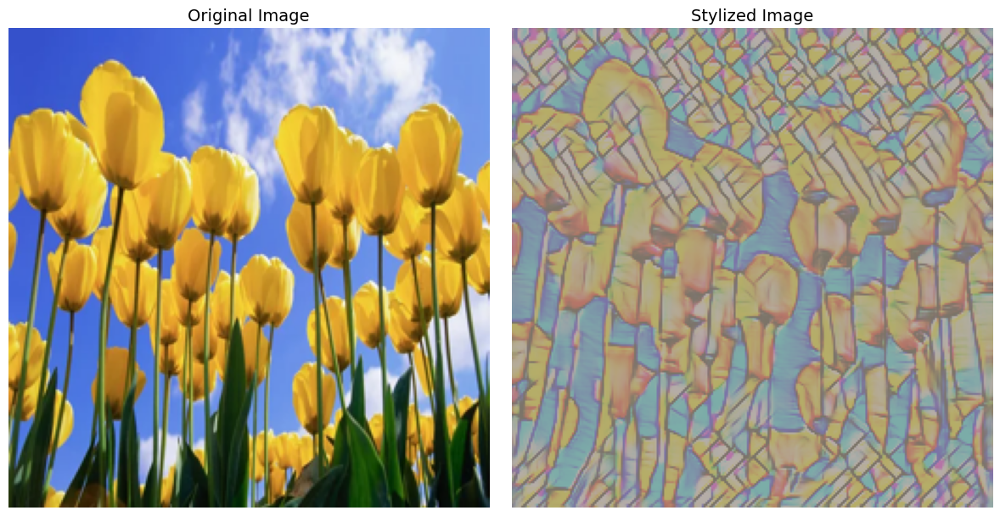

Stylized image saved as 'stylized_output.jpg'


In [ ]:
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.255])])

inverse_transform = transforms.Compose([
    transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
                         std=[1/0.229, 1/0.224, 1/0.255]),
    transforms.Lambda(lambda x: torch.clamp(x,0,1)),
    transforms.ToPILImage()
])

#############
# CODE HERE #
#############
test_img_path = '/content/test2.jpg'
test_img = Image.open(test_img_path).convert('RGB')

test_img = test_img.resize((256, 256))

test_tensor = test_transform(test_img).unsqueeze(0).cuda()

transformer.eval()
with torch.no_grad():
    output_tensor = transformer(test_tensor)

output_img = inverse_transform(output_tensor.squeeze(0).cpu())

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(test_img)
axes[0].set_title('Original Image', fontsize=14)
axes[0].axis('off')

axes[1].imshow(output_img)
axes[1].set_title('Stylized Image', fontsize=14)
axes[1].axis('off')

plt.tight_layout()
plt.show()

#Alpha = 0.1

In [ ]:
alpha = 1e-1
beta = 1e4
gamma = 1e-5

LR = 1e-3
steps = 2000
optimizer = optim.Adam(transformer.parameters(), LR)

In [ ]:
transformer.train()
n_iter = 0
total_running_loss = 0.0
style_running_loss = 0.0
content_running_loss = 0.0
tv_running_loss = 0.0
class Found(Exception): pass
try:
    while True:
        for x, _ in train_loader:

            n_iter += 1
            optimizer.zero_grad()

            x = x.cuda()
            # Image Transform
            y = transformer(x)

            #############
            # CODE HERE #
            #############

            # Content Loss # 위에 content loss, style loss 참고해서 작성...
            content_x = loss_net(x, content_layer_name)
            content_y = loss_net(y, content_layer_name)

            content_loss = alpha * criterion(content_y[list(content_y.keys())[0]],
                            content_x[list(content_x.keys())[0]])

            # Style Loss # 인덱스 마다 계산
            style_y = [gram_matrix(f) for f in loss_net(y, style_layer_name).values()]

            style_loss = 0.
            for i in range(len(style_y)):
                style_loss += criterion(style_y[i], style_gt[i])

            style_loss = beta * style_loss

            # Total Variation Loss
            tv_loss =  gamma * (
                torch.sum(torch.abs(y[:, :, :, :-1] - y[:, :, :, 1:])) +
                torch.sum(torch.abs(y[:, :, :-1, :] - y[:, :, 1:, :])))


            total_loss = content_loss + style_loss + tv_loss
            total_loss.backward()

            total_running_loss += total_loss.item()
            style_running_loss += style_loss.item()
            content_running_loss += content_loss.item()
            tv_running_loss += tv_loss.item()

            optimizer.step()


            if n_iter % show_iter == 0:
                print('Iteration: %d, total loss: %.2f, content loss: %.2f, style loss: %.2f tv loss: %.2f'
                      %(n_iter, total_running_loss/show_iter, content_running_loss/show_iter,
                        style_running_loss/show_iter, tv_running_loss/show_iter))
                total_running_loss = 0.0
                style_running_loss = 0.0
                content_running_loss = 0.0
                tv_running_loss = 0.0

            if n_iter >= steps:
                raise Found

except Found:
    pass


Iteration: 50, total loss: 9.39, content loss: 2.11, style loss: 5.22 tv loss: 2.07
Iteration: 100, total loss: 8.84, content loss: 2.28, style loss: 4.50 tv loss: 2.07
Iteration: 150, total loss: 8.76, content loss: 2.38, style loss: 4.30 tv loss: 2.07
Iteration: 200, total loss: 8.56, content loss: 2.36, style loss: 4.13 tv loss: 2.07
Iteration: 250, total loss: 8.45, content loss: 2.37, style loss: 4.01 tv loss: 2.07
Iteration: 300, total loss: 8.50, content loss: 2.42, style loss: 4.01 tv loss: 2.07
Iteration: 350, total loss: 8.37, content loss: 2.42, style loss: 3.88 tv loss: 2.07
Iteration: 400, total loss: 8.32, content loss: 2.42, style loss: 3.83 tv loss: 2.07
Iteration: 450, total loss: 8.25, content loss: 2.42, style loss: 3.77 tv loss: 2.06
Iteration: 500, total loss: 8.25, content loss: 2.47, style loss: 3.71 tv loss: 2.07
Iteration: 550, total loss: 8.27, content loss: 2.46, style loss: 3.76 tv loss: 2.06
Iteration: 600, total loss: 8.22, content loss: 2.48, style loss: 

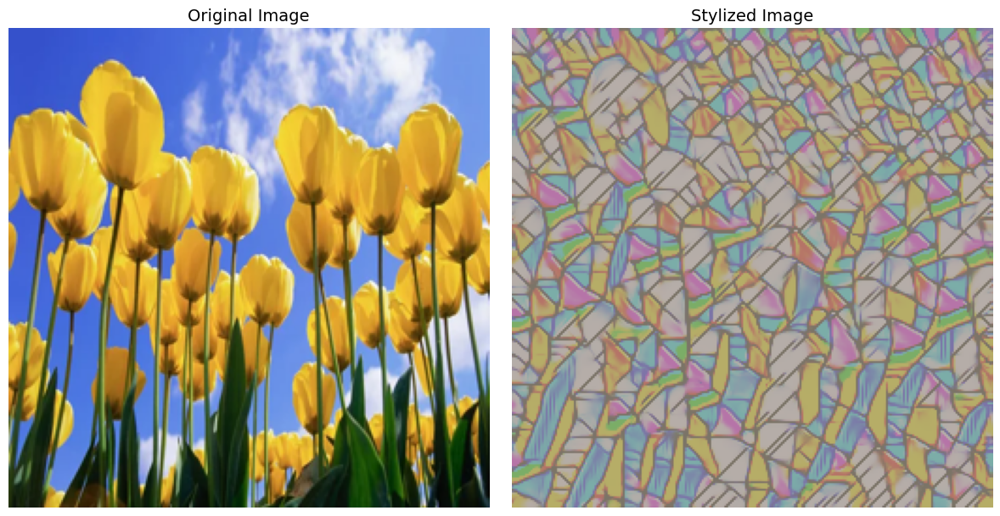

Stylized image saved as 'stylized_output.jpg'


In [ ]:
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.255])])

inverse_transform = transforms.Compose([
    transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
                         std=[1/0.229, 1/0.224, 1/0.255]),
    transforms.Lambda(lambda x: torch.clamp(x,0,1)),
    transforms.ToPILImage()
])

test_img_path = '/content/test2.jpg'
test_img = Image.open(test_img_path).convert('RGB')

test_img = test_img.resize((256, 256))

test_tensor = test_transform(test_img).unsqueeze(0).cuda()

transformer.eval()
with torch.no_grad():
    output_tensor = transformer(test_tensor)

output_img = inverse_transform(output_tensor.squeeze(0).cpu())

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(test_img)
axes[0].set_title('Original Image', fontsize=14)
axes[0].axis('off')

axes[1].imshow(output_img)
axes[1].set_title('Stylized Image', fontsize=14)
axes[1].axis('off')

plt.tight_layout()
plt.show()

#Alpha = 10

In [ ]:
alpha = 1e1
beta = 1e4
gamma = 1e-5

LR = 1e-3
steps = 2000
optimizer = optim.Adam(transformer.parameters(), LR)

In [ ]:
transformer.train()
n_iter = 0
total_running_loss = 0.0
style_running_loss = 0.0
content_running_loss = 0.0
tv_running_loss = 0.0
class Found(Exception): pass
try:
    while True:
        for x, _ in train_loader:

            n_iter += 1
            optimizer.zero_grad()

            x = x.cuda()
            # Image Transform
            y = transformer(x)

            #############
            # CODE HERE #
            #############

            # Content Loss # 위에 content loss, style loss 참고해서 작성...
            content_x = loss_net(x, content_layer_name)
            content_y = loss_net(y, content_layer_name)

            content_loss = alpha * criterion(content_y[list(content_y.keys())[0]],
                            content_x[list(content_x.keys())[0]])

            # Style Loss # 인덱스 마다 계산
            style_y = [gram_matrix(f) for f in loss_net(y, style_layer_name).values()]

            style_loss = 0.
            for i in range(len(style_y)):
                style_loss += criterion(style_y[i], style_gt[i])

            style_loss = beta * style_loss

            # Total Variation Loss
            tv_loss =  gamma * (
                torch.sum(torch.abs(y[:, :, :, :-1] - y[:, :, :, 1:])) +
                torch.sum(torch.abs(y[:, :, :-1, :] - y[:, :, 1:, :])))


            total_loss = content_loss + style_loss + tv_loss
            total_loss.backward()

            total_running_loss += total_loss.item()
            style_running_loss += style_loss.item()
            content_running_loss += content_loss.item()
            tv_running_loss += tv_loss.item()

            optimizer.step()


            if n_iter % show_iter == 0:
                print('Iteration: %d, total loss: %.2f, content loss: %.2f, style loss: %.2f tv loss: %.2f'
                      %(n_iter, total_running_loss/show_iter, content_running_loss/show_iter,
                        style_running_loss/show_iter, tv_running_loss/show_iter))
                total_running_loss = 0.0
                style_running_loss = 0.0
                content_running_loss = 0.0
                tv_running_loss = 0.0

            if n_iter >= steps:
                raise Found

except Found:
    pass


Iteration: 50, total loss: 178.12, content loss: 154.86, style loss: 21.75 tv loss: 1.51
Iteration: 100, total loss: 158.83, content loss: 131.51, style loss: 26.17 tv loss: 1.15
Iteration: 150, total loss: 138.83, content loss: 108.05, style loss: 29.79 tv loss: 0.99
Iteration: 200, total loss: 123.12, content loss: 91.31, style loss: 30.81 tv loss: 1.00
Iteration: 250, total loss: 119.21, content loss: 86.77, style loss: 31.44 tv loss: 0.99
Iteration: 300, total loss: 115.12, content loss: 82.39, style loss: 31.73 tv loss: 1.00
Iteration: 350, total loss: 109.90, content loss: 77.54, style loss: 31.34 tv loss: 1.01
Iteration: 400, total loss: 106.02, content loss: 73.36, style loss: 31.66 tv loss: 1.00
Iteration: 450, total loss: 103.20, content loss: 70.45, style loss: 31.76 tv loss: 0.99
Iteration: 500, total loss: 102.14, content loss: 69.82, style loss: 31.29 tv loss: 1.03
Iteration: 550, total loss: 101.00, content loss: 68.96, style loss: 30.97 tv loss: 1.07
Iteration: 600, tot

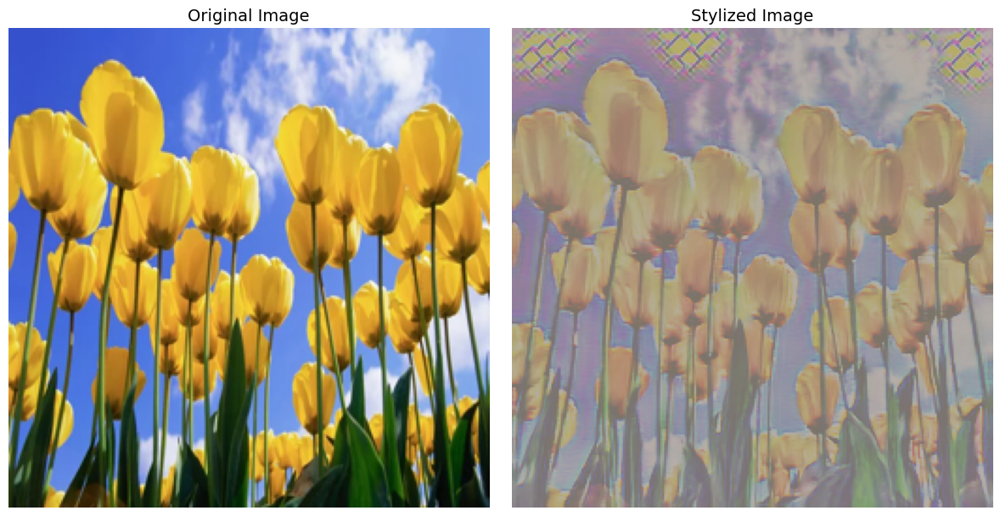

Stylized image saved as 'stylized_output.jpg'


In [ ]:
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.255])])

inverse_transform = transforms.Compose([
    transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
                         std=[1/0.229, 1/0.224, 1/0.255]),
    transforms.Lambda(lambda x: torch.clamp(x,0,1)),
    transforms.ToPILImage()
])

test_img_path = '/content/test2.jpg'
test_img = Image.open(test_img_path).convert('RGB')

test_img = test_img.resize((256, 256))

test_tensor = test_transform(test_img).unsqueeze(0).cuda()

transformer.eval()
with torch.no_grad():
    output_tensor = transformer(test_tensor)

output_img = inverse_transform(output_tensor.squeeze(0).cpu())

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(test_img)
axes[0].set_title('Original Image', fontsize=14)
axes[0].axis('off')

axes[1].imshow(output_img)
axes[1].set_title('Stylized Image', fontsize=14)
axes[1].axis('off')

plt.tight_layout()
plt.show()

#원하는 content, style 이미지 이용한 결과

#original nst

Content 이미지: /content/dog.jpg
Style 이미지: /content/animation.jpg


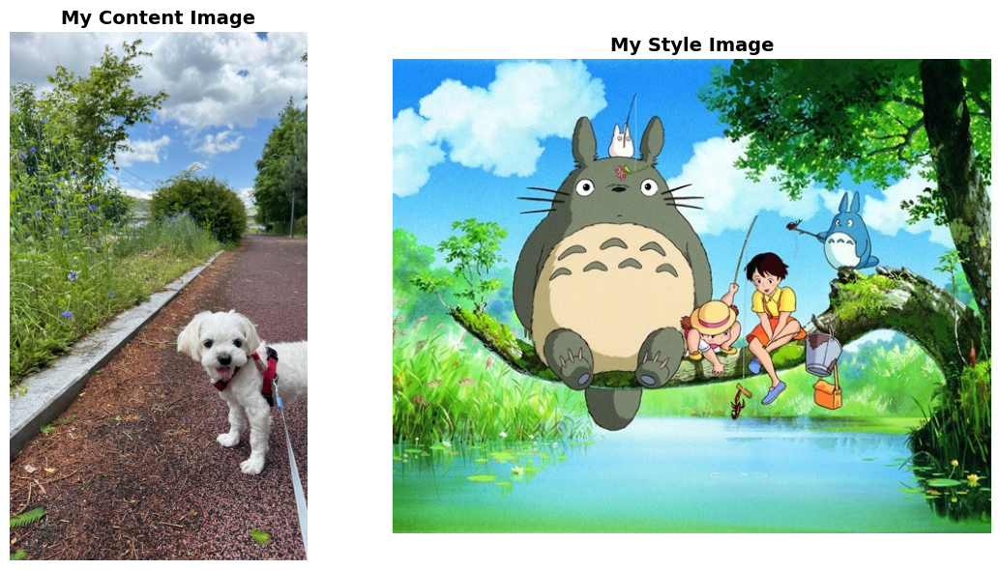

Neural Style Transfer 시작
Content weight (α): 1.0
Style weight (β): 10000000.0
Max iterations: 500
Iteration: 50, loss: 3.4584
Iteration: 100, loss: 2.2217
Iteration: 150, loss: 1.9396
Iteration: 200, loss: 1.7823
Iteration: 250, loss: 1.7021
Iteration: 300, loss: 1.6598
Iteration: 350, loss: 1.6331
Iteration: 400, loss: 1.6152
Iteration: 450, loss: 1.6031
Iteration: 500, loss: 1.5945


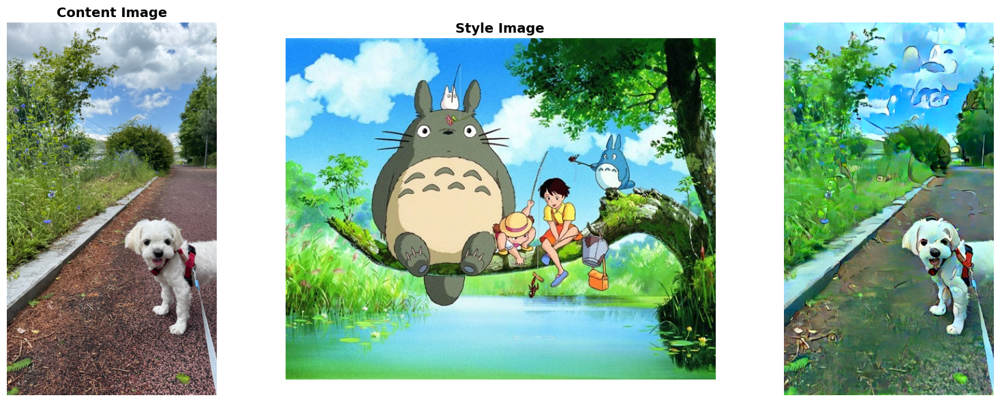

In [ ]:
### original nst ###

from PIL import Image
import matplotlib.pyplot as plt

content_path = '/content/dog.jpg'
style_path = '/content/animation.jpg'

content_img = Image.open(content_path).convert('RGB')
style_img = Image.open(style_path).convert('RGB')

print(f"Content 이미지: {content_path}")
print(f"Style 이미지: {style_path}")

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(content_img)
axes[0].set_title('My Content Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(style_img)
axes[1].set_title('My Style Image', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.show()


# 전처리
img_size = 512
prep = transforms.Compose([
    transforms.Resize(img_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.40760392, 0.45795686, 0.48501961],
                        std=[1,1,1]),
])

post = transforms.Compose([
    transforms.Normalize(mean=[-0.40760392, -0.45795686, -0.48501961],
                        std=[1,1,1]),
    transforms.Lambda(lambda x: torch.clamp(x, 0, 1)),
    transforms.ToPILImage()
])

content = prep(content_img).cuda().unsqueeze(0)
style = prep(style_img).cuda().unsqueeze(0)

out_img = content.clone()
out_img.requires_grad = True

# Loss 설정
criterion = nn.MSELoss()
style_gt = [gram_matrix(f).detach() for f in loss_net(style, style_layer_name).values()]
content_gt = [A.detach() for A in loss_net(content, content_layer_name).values()]

# 하이퍼파라미터
alpha = 1e0
beta = 1e7
max_iter = 500
show_iter = 50

optimizer = optim.LBFGS([out_img])
n_iter = [0]

print("="*60)
print("Neural Style Transfer 시작")
print("="*60)


while n_iter[0] <= max_iter:
    def closure():
        optimizer.zero_grad()

        style_layers = [gram_matrix(f) for f in loss_net(out_img, style_layer_name).values()]
        content_layers = [f for f in loss_net(out_img, content_layer_name).values()]

        style_loss = 0
        for i in range(len(style_layers)):
            style_loss += criterion(style_layers[i], style_gt[i])

        content_loss = criterion(content_layers[0], content_gt[0])

        loss = alpha * content_loss + beta * style_loss
        loss.backward()
        n_iter[0] += 1

        if n_iter[0] % show_iter == (show_iter - 1):
            print(f'Iteration: {n_iter[0]+1}, loss: {loss.item():.4f}')

        return loss

    optimizer.step(closure)

print("="*60)

out_img_hr = post(out_img.data[0].cpu().squeeze())

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title('Content Image', fontsize=14, fontweight='bold')
plt.imshow(content_img)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Style Image', fontsize=14, fontweight='bold')
plt.imshow(style_img)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(out_img_hr)
plt.axis('off')

plt.tight_layout()
plt.savefig('my_nst_result.png', dpi=150, bbox_inches='tight')
plt.show()

#Fast nst

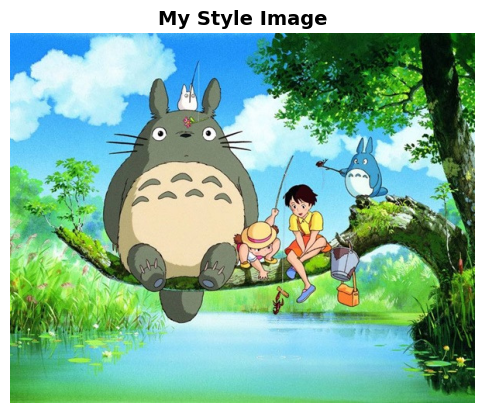

Fast NST 학습 시작
Iteration: 50, total loss: 1.20, content loss: 1.15, style loss: 0.02 tv loss: 0.03
Iteration: 100, total loss: 1.02, content loss: 0.96, style loss: 0.02 tv loss: 0.04
Iteration: 150, total loss: 0.95, content loss: 0.89, style loss: 0.02 tv loss: 0.04
Iteration: 200, total loss: 0.90, content loss: 0.84, style loss: 0.02 tv loss: 0.05
Iteration: 250, total loss: 0.84, content loss: 0.78, style loss: 0.02 tv loss: 0.05
Iteration: 300, total loss: 0.82, content loss: 0.75, style loss: 0.02 tv loss: 0.05
Iteration: 350, total loss: 0.83, content loss: 0.76, style loss: 0.02 tv loss: 0.05
Iteration: 400, total loss: 0.75, content loss: 0.68, style loss: 0.02 tv loss: 0.05
Iteration: 450, total loss: 0.76, content loss: 0.69, style loss: 0.02 tv loss: 0.05
Iteration: 500, total loss: 0.75, content loss: 0.68, style loss: 0.02 tv loss: 0.05
Iteration: 550, total loss: 0.77, content loss: 0.70, style loss: 0.02 tv loss: 0.05
Iteration: 600, total loss: 0.74, content loss: 0.6

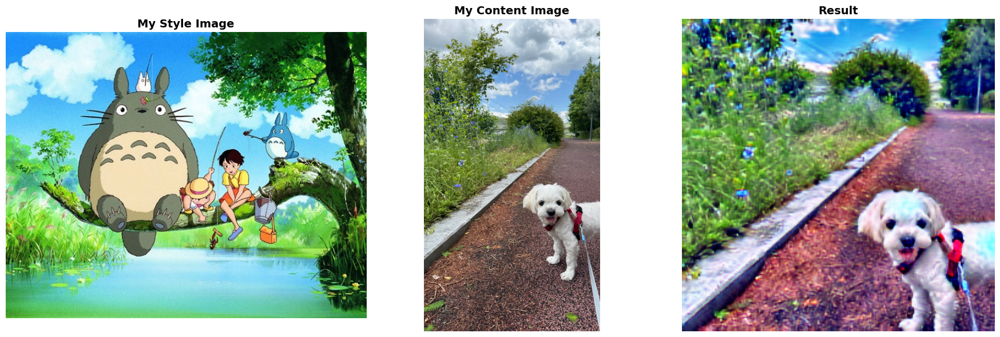

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

style_path = '/content/animation.jpg'
content_test_path = '/content/dog.jpg'

style_img = Image.open(style_path).convert('RGB')

plt.figure(figsize=(6, 6))
plt.imshow(style_img)
plt.title('My Style Image', fontsize=14, fontweight='bold')
plt.axis('off')
plt.show()

style_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor()
])

style_tensor = style_transform(style_img).unsqueeze(0).cuda()

with torch.no_grad():
    style_features = loss_net(style_tensor, style_layer_name)
    style_gt = [gram_matrix(f) for f in style_features.values()]


transformer = ImageTransformNet().cuda()

# 하이퍼파라미터
alpha = 1e-1
beta = 1e3
gamma = 1e-6
LR = 1e-3
steps = 2000
show_iter = 50

optimizer = optim.Adam(transformer.parameters(), LR)
criterion = nn.MSELoss()

print("="*60)
print("Fast NST 학습 시작")
print("="*60)

transformer.train()
n_iter = 0
total_running_loss = 0.0
style_running_loss = 0.0
content_running_loss = 0.0
tv_running_loss = 0.0

class Found(Exception): pass

try:
    while True:
        for x, _ in train_loader:
            n_iter += 1
            optimizer.zero_grad()

            x = x.cuda()
            y = transformer(x)

            # Content Loss
            content_x = loss_net(x, content_layer_name)
            content_y = loss_net(y, content_layer_name)
            content_loss = alpha * criterion(
                content_y[list(content_y.keys())[0]],
                content_x[list(content_x.keys())[0]]
            )

            # Style Loss
            style_y = [gram_matrix(f) for f in loss_net(y, style_layer_name).values()]
            style_loss = 0.
            for i in range(len(style_y)):
                style_loss += criterion(style_y[i], style_gt[i])
            style_loss = beta * style_loss

            # TV Loss
            tv_loss = gamma * (
                torch.sum(torch.abs(y[:, :, :, :-1] - y[:, :, :, 1:])) +
                torch.sum(torch.abs(y[:, :, :-1, :] - y[:, :, 1:, :]))
            )

            total_loss = content_loss + style_loss + tv_loss
            total_loss.backward()

            total_running_loss += total_loss.item()
            style_running_loss += style_loss.item()
            content_running_loss += content_loss.item()
            tv_running_loss += tv_loss.item()

            optimizer.step()

            if n_iter % show_iter == 0:
                print('Iteration: %d, total loss: %.2f, content loss: %.2f, style loss: %.2f tv loss: %.2f'
                      %(n_iter, total_running_loss/show_iter, content_running_loss/show_iter,
                        style_running_loss/show_iter, tv_running_loss/show_iter))
                total_running_loss = 0.0
                style_running_loss = 0.0
                content_running_loss = 0.0
                tv_running_loss = 0.0

            if n_iter >= steps:
                raise Found

except Found:
    pass

print("="*60)

test_img = Image.open(content_test_path).convert('RGB')

test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor()
])

test_tensor = test_transform(test_img).unsqueeze(0).cuda()

transformer.eval()
with torch.no_grad():
    output = transformer(test_tensor)

output_img = transforms.ToPILImage()(output.squeeze(0).cpu().clamp(0, 1))

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(style_img)
axes[0].set_title('My Style Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(test_img)
axes[1].set_title('My Content Image', fontsize=14, fontweight='bold')
axes[1].axis('off')

axes[2].imshow(output_img)
axes[2].set_title('Result', fontsize=14, fontweight='bold')
axes[2].axis('off')

plt.tight_layout()
plt.savefig('my_fast_nst_result.png', dpi=150, bbox_inches='tight')
plt.show()



### *References*
[1] Neural Transfer Pytorch Tutorial (https://pytorch.org/tutorials/advanced/neural_style_tutorial.html)